## TFRecord ：TensorFlow 数据集存储格式 
https://tf.wiki/zh/basic/tools.html

In [9]:
import tensorflow as tf
import os

data_dir = '/DATA/data_Cats-vs-Dogs'
train_cats_dir = data_dir + '/train/cats/'
train_dogs_dir = data_dir + '/train/dogs/'
tfrecord_file = data_dir + '/train/train.tfrecords'

train_cat_filenames = [train_cats_dir + filename for filename in os.listdir(train_cats_dir)]
train_dog_filenames = [train_dogs_dir + filename for filename in os.listdir(train_dogs_dir)]
train_filenames = train_cat_filenames + train_dog_filenames
train_labels = [0] * len(train_cat_filenames) + [1] * len(train_dog_filenames)  # 将 cat 类的标签设为0，dog 类的标签设为1

In [10]:
with tf.io.TFRecordWriter(tfrecord_file) as writer:
    for filename, label in zip(train_filenames, train_labels):
        image = open(filename, 'rb').read()     # 读取数据集图片到内存，image 为一个 Byte 类型的字符串
        feature = {                             # 建立 tf.train.Feature 字典
            'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image])),  # 图片是一个 Bytes 对象
            'label': tf.train.Feature(int64_list=tf.train.Int64List(value=[label]))   # 标签是一个 Int 对象
        }
        example = tf.train.Example(features=tf.train.Features(feature=feature)) # 通过字典建立 Example
        writer.write(example.SerializeToString())   # 将Example序列化并写入 TFRecord 文件

In [11]:
raw_dataset = tf.data.TFRecordDataset(tfrecord_file)    # 读取 TFRecord 文件

feature_description = { # 定义Feature结构，告诉解码器每个Feature的类型是什么
    'image': tf.io.FixedLenFeature([], tf.string),
    'label': tf.io.FixedLenFeature([], tf.int64),
}

def _parse_example(example_string): # 将 TFRecord 文件中的每一个序列化的 tf.train.Example 解码
    feature_dict = tf.io.parse_single_example(example_string, feature_description)
    feature_dict['image'] = tf.io.decode_jpeg(feature_dict['image'])    # 解码JPEG图片
    return feature_dict['image'], feature_dict['label']

dataset = raw_dataset.map(_parse_example)

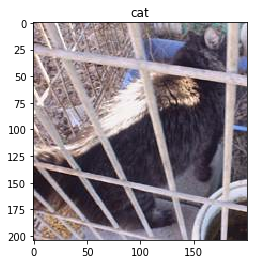

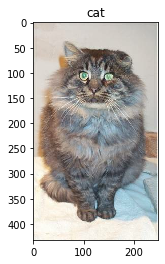

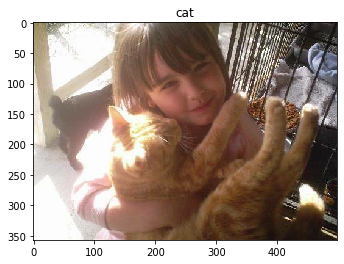

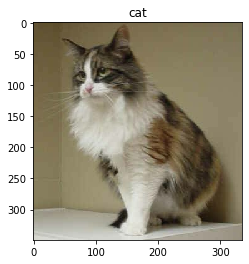

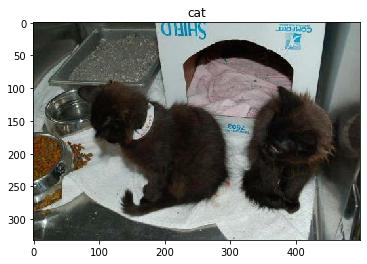

...

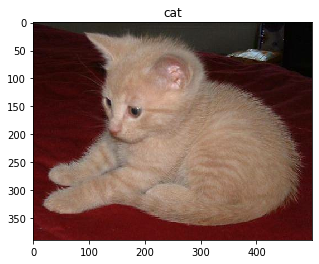

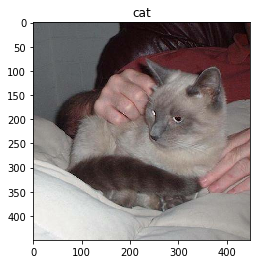

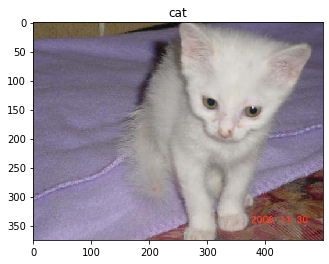

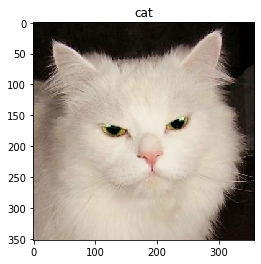

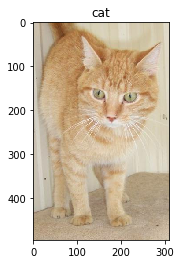

KeyboardInterrupt: 

In [13]:
import matplotlib.pyplot as plt 

for image, label in dataset:
    plt.title('cat' if label == 0 else 'dog')
    plt.imshow(image.numpy())
    plt.show()